# Fundraising Operations Optimization

## Analysis and Modeling designed to optimize fundraising operations

### 1. Who Donors Are, create personaes for marketing using K Means Cluster
### 2. How to Identify Top Donors, using Logistic Regression
### 3. How to Assign the Right Solicitor to Make Donors Successful, using a RandomForestClassifier

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from warnings import filterwarnings 
from datetime import date
from scipy import stats 
filterwarnings('ignore')

from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.cluster import KMeans
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.linear_model import LogisticRegression, Lasso
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier


Data was taken from a competition proposal run by APRA American Prospect Research Association.  Apra is “Apra is committed to serving, representing and advancing the professionals and practices that enable the philanthropic success of institutions that rely on fundraising to achieve their missions” Who We Are (aprahome.org)

There are three different files: Constituent, Gifts and Interactions

In [6]:
#Load gift data
apragift = pd.read_csv('data/ApraGift.csv')
apragift.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176728 entries, 0 to 176727
Data columns (total 11 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   GIFT_ID           176728 non-null  int64  
 1   CONTACT_ID        176728 non-null  int64  
 2   GIFT_AMOUNT       176728 non-null  float64
 3   GIFT_DATE         176728 non-null  object 
 4   CAMPAIGN          96845 non-null   object 
 5   APPEAL            176728 non-null  object 
 6   PRIMARY_UNIT      176728 non-null  object 
 7   GIFT_CHANNEL      98794 non-null   object 
 8   PAYMENT_TYPE      176728 non-null  object 
 9   GIFT_DESIGNATION  176728 non-null  object 
 10  GIFT_TYPE         176728 non-null  object 
dtypes: float64(1), int64(2), object(8)
memory usage: 14.8+ MB


In [9]:
#Check gift load
apragift.head()

,GIFT_ID,CONTACT_ID,GIFT_AMOUNT,GIFT_DATE,CAMPAIGN,APPEAL,PRIMARY_UNIT,GIFT_CHANNEL,PAYMENT_TYPE,GIFT_DESIGNATION,GIFT_TYPE
0,626242967,181224721,5000000.0,12/21/2008,Campaign for Students,Scholarship Support Appeal,Attain Campus,NaN,Gift,Social Justice Fund,Hard Credit
1,619321323,181224724,5000000.0,12/21/2008,Campaign for Students,Scholarship Support Appeal,Attain Campus,NaN,Gift,Social Justice Fund,Soft Credit
2,619317311,181224724,5000000.0,12/21/2018,Insights Campaign,Monthly Giving Appeal,Attain Campus,Mail,Gift,Unity Fund,Hard Credit
3,626225008,181227667,5000000.0,5/30/2011,Campaign for Students,Honoring Traditions Appeal,Attain Campus,NaN,Gift,Clarence Fund,Hard Credit
4,626228684,181227667,5000000.0,8/21/2014,NaN,Scholarship Support Appeal,Attain Campus,NaN,Gift,Education Fund,Hard Credit


In [11]:
#Load interaction data
aprainter = pd.read_csv('data/ApraInter.csv')
aprainter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12385 entries, 0 to 12384
Data columns (total 6 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   CONTACT_ID               12385 non-null  int64 
 1   INTERACTION_DATE         12385 non-null  object
 2   INTERACTION_TYPE         12385 non-null  object
 3   SUBSTANTIVE_INTERACTION  12385 non-null  int64 
 4   INTERACTION_SUMMARY      12385 non-null  object
 5   AUTHOR_NAME              12385 non-null  object
dtypes: int64(2), object(4)
memory usage: 580.7+ KB


In [13]:
#Check interaction load
aprainter.head()

,CONTACT_ID,INTERACTION_DATE,INTERACTION_TYPE,SUBSTANTIVE_INTERACTION,INTERACTION_SUMMARY,AUTHOR_NAME
0,181204119,12/16/23,Phone,0,Increasing Support,Alfreda Priddis
1,181204119,05/30/24,Mail,0,Increasing Support,Alfreda Priddis
2,181204166,06/12/22,Email,0,Thanking Donor for Contribution,Sabina Embury
3,181204166,07/22/22,Meeting - In Person,1,Philanthropic Interests,Sabina Embury
4,181204166,11/11/22,Email,0,Exploring Affinity,Sabina Embury


In [15]:
#Load constituent data
apraconst = pd.read_csv('data/ApraConst.csv')
apraconst.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13359 entries, 0 to 13358
Data columns (total 15 columns):
 #   Column                          Non-Null Count  Dtype 
---  ------                          --------------  ----- 
 0   CONTACT_ID                      13359 non-null  int64 
 1   IS_PERSON                       13359 non-null  bool  
 2   DECEASED                        13359 non-null  bool  
 3   CONTACT_NAME                    13359 non-null  object
 4   HOUSEHOLD_ID                    13359 non-null  object
 5   PRIMARY_HOUSEHOLD_MEMBER        13359 non-null  bool  
 6   HOUSEHOLD_NAME                  13359 non-null  object
 7   PRIMARY_CONSTITUENCY            13359 non-null  object
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  13359 non-null  object
 9   ASSIGNED_PROSEPCT               13359 non-null  bool  
 10  ASSIGNMENT_UNIT                 5789 non-null   object
 11  SOLICITOR_NAME                  5789 non-null   object
 12  ASSIGNMENT_START_DATE           5789 non-null 

In [17]:
#Check constituent load
apraconst.head()

,CONTACT_ID,IS_PERSON,DECEASED,CONTACT_NAME,HOUSEHOLD_ID,PRIMARY_HOUSEHOLD_MEMBER,HOUSEHOLD_NAME,PRIMARY_CONSTITUENCY,HOUSEHOLD_PRIMARY_CONSTITUENCY,ASSIGNED_PROSEPCT,ASSIGNMENT_UNIT,SOLICITOR_NAME,ASSIGNMENT_START_DATE,ASSIGNMENT_STAGE,RESTRICTIONS
0,181222420,True,False,"Rase, Kilian",A:181222419B:181222420,False,Danika Rase and Kilian Rase,Alumni,Alumni,True,DXO,"Bandt, Cindy",04/13/22,Cultivation,Do Not Email
1,181213983,True,False,"Haselden, Gael",A:181213972B:181213983,False,Kendal Haselden and Gael Haselden,Alumni,Alumni,False,DXO,"Bandt, Cindy",04/13/22,Disqualified,NaN
2,181222419,True,False,"Rase, Danika",A:181222419B:181222420,True,Danika Rase and Kilian Rase,Alumni,Alumni,False,DXO,"Bandt, Cindy",04/13/22,Cultivation,NaN
3,181213972,True,False,"Haselden, Kendal",A:181213972B:181213983,True,Kendal Haselden and Gael Haselden,Alumni,Alumni,False,DXO,"Bandt, Cindy",04/13/22,Disqualified,NaN
4,181278339,False,False,LunarLandscape Ventures,A:181278339,True,LunarLandscape Ventures,Foundations,Foundations,False,Law,"Anespie, Kipp",04/13/22,Qualification,NaN


## Data Cleaning

In [20]:
#Convert date to date time
apraconst['ASSIGNMENT_START_DATE'] = pd.to_datetime(apraconst['ASSIGNMENT_START_DATE'])
aprainter['INTERACTION_DATE'] = pd.to_datetime(aprainter['INTERACTION_DATE'])
apragift['GIFT_DATE'] = pd.to_datetime(apragift['GIFT_DATE'])

#apraconst['ASSIGNMENT_START_DATE'].value_counts()
#aprainter['INTERACTION_DATE'].value_counts()
#apragift['GIFT_DATE'].value_counts()

In [22]:
#Data is very clean.  Null values just designate that this const has been assigned

apragift.isnull().sum() #consider removing campaign, gift channel messy data, 2027 founders outlier
aprainter.isnull().sum() #no null values
apraconst.isnull().sum()

CONTACT_ID                            0
IS_PERSON                             0
DECEASED                              0
CONTACT_NAME                          0
HOUSEHOLD_ID                          0
PRIMARY_HOUSEHOLD_MEMBER              0
HOUSEHOLD_NAME                        0
PRIMARY_CONSTITUENCY                  0
HOUSEHOLD_PRIMARY_CONSTITUENCY        0
ASSIGNED_PROSEPCT                     0
ASSIGNMENT_UNIT                    7570
SOLICITOR_NAME                     7570
ASSIGNMENT_START_DATE              7570
ASSIGNMENT_STAGE                   7570
RESTRICTIONS                      12169
dtype: int64

In [24]:
#Start to create one file
apradata = pd.merge(apraconst, apragift, on='CONTACT_ID', how='left')
apradata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 176839 entries, 0 to 176838
Data columns (total 25 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   CONTACT_ID                      176839 non-null  int64         
 1   IS_PERSON                       176839 non-null  bool          
 2   DECEASED                        176839 non-null  bool          
 3   CONTACT_NAME                    176839 non-null  object        
 4   HOUSEHOLD_ID                    176839 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        176839 non-null  bool          
 6   HOUSEHOLD_NAME                  176839 non-null  object        
 7   PRIMARY_CONSTITUENCY            176839 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  176839 non-null  object        
 9   ASSIGNED_PROSEPCT               176839 non-null  bool          
 10  ASSIGNMENT_UNIT                 88214 non-null   object 

In [26]:
#Check data
apradata.head()

,CONTACT_ID,IS_PERSON,DECEASED,CONTACT_NAME,HOUSEHOLD_ID,PRIMARY_HOUSEHOLD_MEMBER,HOUSEHOLD_NAME,PRIMARY_CONSTITUENCY,HOUSEHOLD_PRIMARY_CONSTITUENCY,ASSIGNED_PROSEPCT,...,GIFT_ID,GIFT_AMOUNT,GIFT_DATE,CAMPAIGN,APPEAL,PRIMARY_UNIT,GIFT_CHANNEL,PAYMENT_TYPE,GIFT_DESIGNATION,GIFT_TYPE
0,181222420,True,False,"Rase, Kilian",A:181222419B:181222420,False,Danika Rase and Kilian Rase,Alumni,Alumni,True,...,626244419.0,273.00,2008-06-07,Campaign for Students,Scholarship Support Appeal,Attain Campus,NaN,Gift,Garcia Fund,Hard Credit
1,181222420,True,False,"Rase, Kilian",A:181222419B:181222420,False,Danika Rase and Kilian Rase,Alumni,Alumni,True,...,626244410.0,273.00,2012-09-23,Insights Campaign,Honoring Traditions Appeal,Belle Campus,Email,Gift,Transformation Fund,Hard Credit
2,181213983,True,False,"Haselden, Gael",A:181213972B:181213983,False,Kendal Haselden and Gael Haselden,Alumni,Alumni,False,...,619364536.0,9622.78,2021-06-03,Insights Campaign,Alumni Engagement Appeal,Attain Campus,Crowdfunding,Gift Annuity,Alli Fund,Hard Credit
3,181213983,True,False,"Haselden, Gael",A:181213972B:181213983,False,Kendal Haselden and Gael Haselden,Alumni,Alumni,False,...,619420988.0,150.00,2006-03-25,Campaign for Students,Student Experience Appeal,Cooke Campus,NaN,Gift,Criminal Justice Reform Fund,Soft Credit
4,181213983,True,False,"Haselden, Gael",A:181213972B:181213983,False,Kendal Haselden and Gael Haselden,Alumni,Alumni,False,...,619326216.0,150.00,2011-03-24,Campaign for Students,Alumni Engagement Appeal,Attain Campus,NaN,Gift,Quinlan Initiative Fund,Hard Credit


In [28]:
#Merge in interaction data
apradatatotal = pd.merge(apradata, aprainter, on='CONTACT_ID', how='left')
apradatatotal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 353917 entries, 0 to 353916
Data columns (total 30 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   CONTACT_ID                      353917 non-null  int64         
 1   IS_PERSON                       353917 non-null  bool          
 2   DECEASED                        353917 non-null  bool          
 3   CONTACT_NAME                    353917 non-null  object        
 4   HOUSEHOLD_ID                    353917 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        353917 non-null  bool          
 6   HOUSEHOLD_NAME                  353917 non-null  object        
 7   PRIMARY_CONSTITUENCY            353917 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  353917 non-null  object        
 9   ASSIGNED_PROSEPCT               353917 non-null  bool          
 10  ASSIGNMENT_UNIT                 265292 non-null  object 

In [30]:
apradatatotal = apradatatotal[apradatatotal['DECEASED'] != 'True']

In [32]:
apradatatotal = apradatatotal[apradatatotal['IS_PERSON'] != 'True']

In [34]:
apradatatotal['IS_PERSON'].value_counts()

IS_PERSON
True     338554
False     15363
Name: count, dtype: int64

In [36]:
#Drop columns as appeal is more important
apradatatotal = apradatatotal.drop(columns = ['CAMPAIGN'])

In [38]:
#Drop restrictions as data is missing
apradatatotal = apradatatotal[apradatatotal[['RESTRICTIONS']].isnull().any(axis=1)]

In [40]:
apradatatotal = apradatatotal.drop(columns = ['RESTRICTIONS'])

In [42]:
apradatatotal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 321932 entries, 2 to 353916
Data columns (total 28 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   CONTACT_ID                      321932 non-null  int64         
 1   IS_PERSON                       321932 non-null  bool          
 2   DECEASED                        321932 non-null  bool          
 3   CONTACT_NAME                    321932 non-null  object        
 4   HOUSEHOLD_ID                    321932 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        321932 non-null  bool          
 6   HOUSEHOLD_NAME                  321932 non-null  object        
 7   PRIMARY_CONSTITUENCY            321932 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  321932 non-null  object        
 9   ASSIGNED_PROSEPCT               321932 non-null  bool          
 10  ASSIGNMENT_UNIT                 240972 non-null  object      

## Feature Engineering

In [45]:
#Add a month year column
apradatatotal['MONTHYEAR'] = apradatatotal['GIFT_DATE'].dt.strftime('%Y-%m')


In [46]:
print(apradatatotal['MONTHYEAR'])

2         2021-06
3         2006-03
4         2011-03
5         2013-05
6         2014-02
           ...   
353912    2015-11
353913    2016-11
353914    2016-11
353915    2023-04
353916    2001-11
Name: MONTHYEAR, Length: 321932, dtype: object


In [49]:
#Add a year column
apradatatotal['YEAR'] = apradatatotal['GIFT_DATE'].dt.year

In [51]:
#Change binary objects to numerical for modeling
apradatatotal['PRIMARY_HOUSEHOLD_MEMBER'] = apradatatotal['PRIMARY_HOUSEHOLD_MEMBER'].astype(int)
apradatatotal['ASSIGNED_PROSPECT'] = apradatatotal['ASSIGNED_PROSEPCT'].astype(int)

In [53]:
#Create total gifts by month, by contact
gift_by_month = apradatatotal.groupby('CONTACT_ID').agg({
    'GIFT_AMOUNT': ['sum', 'mean', 'count'],
    'MONTHYEAR': lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'
}).reset_index()

In [54]:
#Get total gifts by month
total_gift_by_month = apradatatotal.groupby('MONTHYEAR').agg({
    'GIFT_AMOUNT': ['sum', 'mean', 'count']
}).reset_index()

In [57]:
#Get total gifts by appeal
gift_by_appeal = apradatatotal.groupby('CONTACT_ID').agg({
    'GIFT_AMOUNT': ['sum', 'mean', 'count'],
    'APPEAL': lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'
}).reset_index()

In [58]:
#Get total gifts by payment type and ID
gift_type = apradatatotal.groupby('CONTACT_ID').agg({
    'GIFT_AMOUNT': ['sum', 'mean', 'count'],
    'PAYMENT_TYPE': lambda x: x.mode()[0] if not x.mode().empty else 'Unknown'
}).reset_index()

In [59]:
#Get total gift by ID
gift_total = apradatatotal.groupby('CONTACT_ID').agg({
    'GIFT_AMOUNT': ['sum', 'mean', 'count']
}).reset_index()

In [61]:
#Create columns for gifts
gift_total.columns = ['CONTACT_ID', 'TOTAL_SUM', 'TOTAL_MEAN', 'TOTAL_COUNT']

In [65]:
#Add the totals by contact id
apradatatotal = pd.merge(apradatatotal, gift_total, on='CONTACT_ID', how='left')

In [67]:
#Calculate the overall mean gift

apradatatotal['MEAN_GIFT'] = apradatatotal['GIFT_AMOUNT'].mean()
print (apradatatotal['MEAN_GIFT'])

0         1754.793483
1         1754.793483
2         1754.793483
3         1754.793483
4         1754.793483
             ...     
321927    1754.793483
321928    1754.793483
321929    1754.793483
321930    1754.793483
321931    1754.793483
Name: MEAN_GIFT, Length: 321932, dtype: float64


In [69]:
apradatatotal['TOP_DONOR'] = (apradatatotal['TOTAL_SUM'] > apradatatotal['MEAN_GIFT']).astype(int)

In [71]:
#Create yearly gift total
gift_yearly = apradatatotal.groupby(['CONTACT_ID', 'YEAR'], as_index=False)['GIFT_AMOUNT'].sum()

In [73]:
gift_yearly.rename(columns={'GIFT_AMOUNT': 'TOTAL_YEARLY'}, inplace=True)

In [75]:
gift_yearly['PREVIOUS_YEAR']=gift_yearly.groupby('CONTACT_ID')['TOTAL_YEARLY'].shift(1)

In [77]:
gift_yearly['TRENDUP'] = (gift_yearly['TOTAL_YEARLY'] > gift_yearly['PREVIOUS_YEAR']).astype(int)

In [79]:
apradatatotal = pd.merge(apradatatotal, gift_yearly[['CONTACT_ID', 'YEAR', 'TRENDUP']], on =['CONTACT_ID', 'YEAR'], how='left')

In [81]:
#Clear out null values
apradatatotal = apradatatotal.dropna()

In [83]:
apradatatotal['SUCCESSFACTOR'] = (apradatatotal['TOP_DONOR'] + apradatatotal['TRENDUP']).astype(int)

In [85]:
apradatatotal['SUCCESS'] = (apradatatotal['SUCCESSFACTOR'] > 1).astype(int)

In [87]:
apradatatotal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116372 entries, 39 to 240802
Data columns (total 39 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   CONTACT_ID                      116372 non-null  int64         
 1   IS_PERSON                       116372 non-null  bool          
 2   DECEASED                        116372 non-null  bool          
 3   CONTACT_NAME                    116372 non-null  object        
 4   HOUSEHOLD_ID                    116372 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        116372 non-null  int32         
 6   HOUSEHOLD_NAME                  116372 non-null  object        
 7   PRIMARY_CONSTITUENCY            116372 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  116372 non-null  object        
 9   ASSIGNED_PROSEPCT               116372 non-null  bool          
 10  ASSIGNMENT_UNIT                 116372 non-null  object     

In [89]:
#Add classification categories to find successfuly solicitors

def SuccessSolicitor(row):
    if row['SUCCESS'] == 1 and pd.notna(row['SOLICITOR_NAME']) and row['SOLICITOR_NAME'].strip() != "":
        return row['SOLICITOR_NAME'] + "_Success"
    else:
        return None #return none if not a success or solicitor
           

In [91]:
apradatatotal['SOLICITOR_SUCCESS'] = apradatatotal.apply(SuccessSolicitor, axis=1)

In [92]:
apradatatotal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 116372 entries, 39 to 240802
Data columns (total 40 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   CONTACT_ID                      116372 non-null  int64         
 1   IS_PERSON                       116372 non-null  bool          
 2   DECEASED                        116372 non-null  bool          
 3   CONTACT_NAME                    116372 non-null  object        
 4   HOUSEHOLD_ID                    116372 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        116372 non-null  int32         
 6   HOUSEHOLD_NAME                  116372 non-null  object        
 7   PRIMARY_CONSTITUENCY            116372 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  116372 non-null  object        
 9   ASSIGNED_PROSEPCT               116372 non-null  bool          
 10  ASSIGNMENT_UNIT                 116372 non-null  object     

In [95]:
apradatatotal['SOLICITOR_SUCCESS'].value_counts()

SOLICITOR_SUCCESS
Embury, Sabina_Success       15744
Bandt, Cindy_Success         15630
Arp, Josefina_Success         3466
Anespie, Kipp_Success         2955
Klausen, Leonerd_Success      2846
Reiach, Etienne_Success       2561
Misken, Brnaby_Success        2309
Simeon, Carmelina_Success     2178
Gownge, Lurleen_Success       1930
Priddis, Alfreda_Success      1886
Hanretty, Rodd_Success        1756
Coll, Libbie_Success          1693
Egginson, Reggie_Success      1481
Donaghy, Brnaba_Success       1328
Ryburn, Rab_Success            975
Name: count, dtype: int64

In [97]:
#Only take last 10 years of data
from datetime import datetime, timedelta

ten_years = pd.to_datetime('2014-01-01')

classdatatotal = apradatatotal[apradatatotal['GIFT_DATE'] >= ten_years]

In [99]:
classdatatotal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   CONTACT_ID                      46199 non-null  int64         
 1   IS_PERSON                       46199 non-null  bool          
 2   DECEASED                        46199 non-null  bool          
 3   CONTACT_NAME                    46199 non-null  object        
 4   HOUSEHOLD_ID                    46199 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        46199 non-null  int32         
 6   HOUSEHOLD_NAME                  46199 non-null  object        
 7   PRIMARY_CONSTITUENCY            46199 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  46199 non-null  object        
 9   ASSIGNED_PROSEPCT               46199 non-null  bool          
 10  ASSIGNMENT_UNIT                 46199 non-null  object        
 11  SOLIC

In [101]:
classdatatotal.to_csv('class-total.csv')

Imported v0.1.905. Please call AutoViz in this sequence:
    AV = AutoViz_Class()
    %matplotlib inline
    dfte = AV.AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=1, lowess=False,
               chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30, save_plot_dir=None)
Shape of your Data Set loaded: (46199, 41)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  5
    Number of Integer-Categorical Columns =  3
    Number of String-Categorical Columns =  14
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  2
    Number of Numeric-Boolean Columns =  5
    Number of Discrete String Columns =  3
    Number of NLP String Columns =  4
    Number 

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
Unnamed: 0,int64,0.000000,100,39.000000,240623.000000,Possible ID column: drop before modeling step.
CONTACT_ID,int64,0.000000,4,181204119.000000,181279011.000000,Column has 2224 outliers greater than upper bound (181268816.00) or lower than lower bound(181180664.00). Cap them or remove them.
IS_PERSON,bool,0.000000,0,0.000000,1.000000,No issue
DECEASED,bool,0.000000,0,0.000000,0.000000,Possible Zero-variance or low information colum: drop before modeling step.
CONTACT_NAME,object,0.000000,4,,,No issue
HOUSEHOLD_ID,object,0.000000,3,,,No issue
PRIMARY_HOUSEHOLD_MEMBER,int64,0.000000,0,0.000000,1.000000,No issue
HOUSEHOLD_NAME,object,0.000000,3,,,No issue
PRIMARY_CONSTITUENCY,object,0.000000,0,,,"2 rare categories: ['Students', 'Other Organizations']. Group them into a single category or drop the categories."
HOUSEHOLD_PRIMARY_CONSTITUENCY,object,0.000000,0,,,"2 rare categories: ['Students', 'Other Organizations']. Group them into a single category or drop the categories."


Number of All Scatter Plots = 15


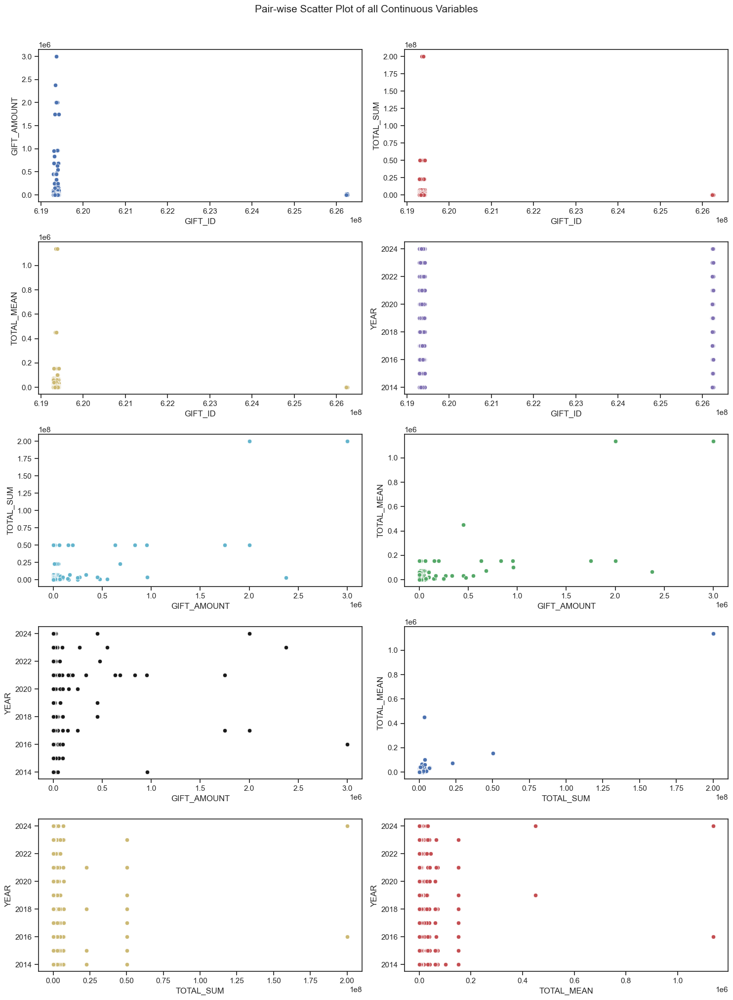

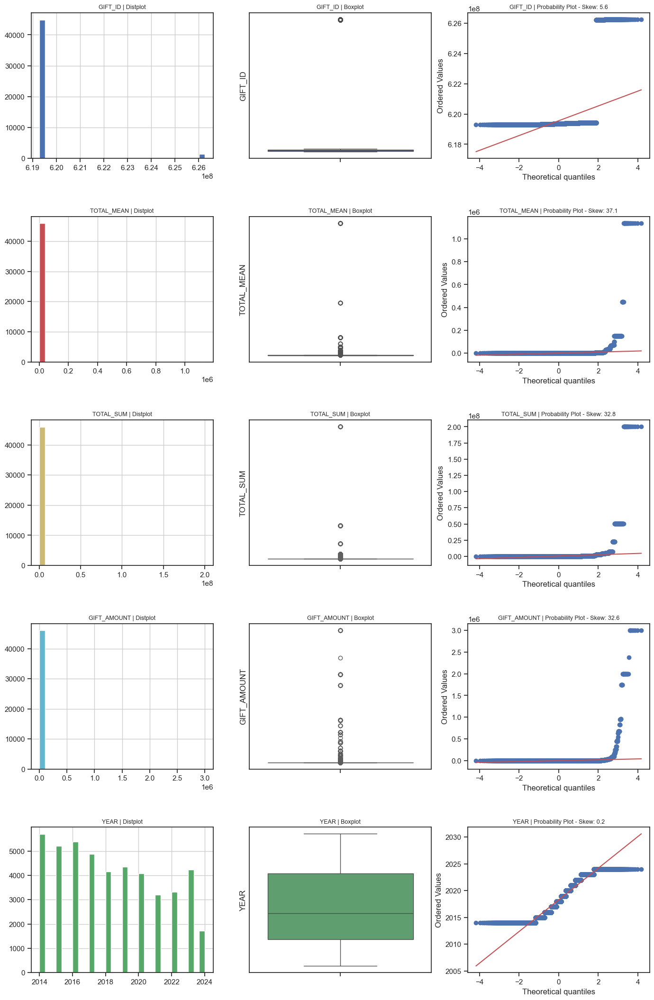

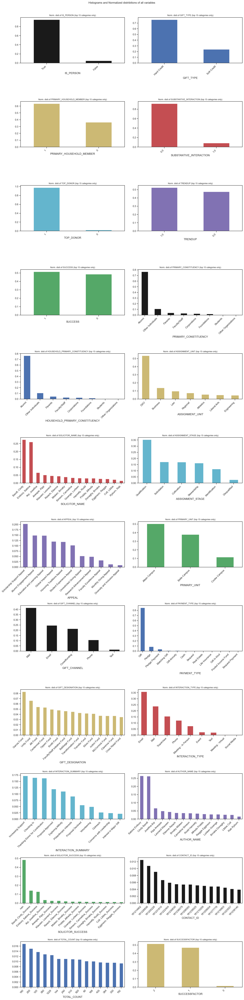

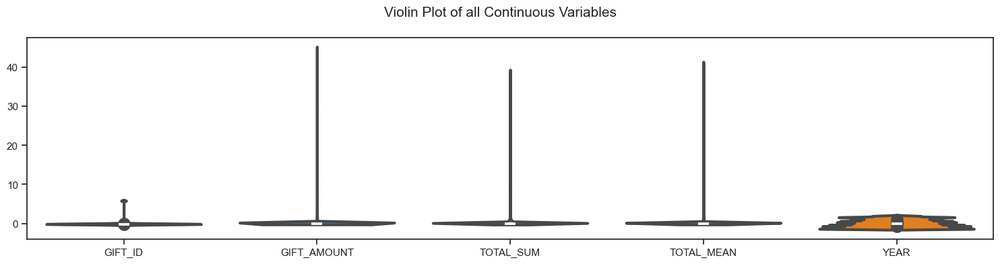

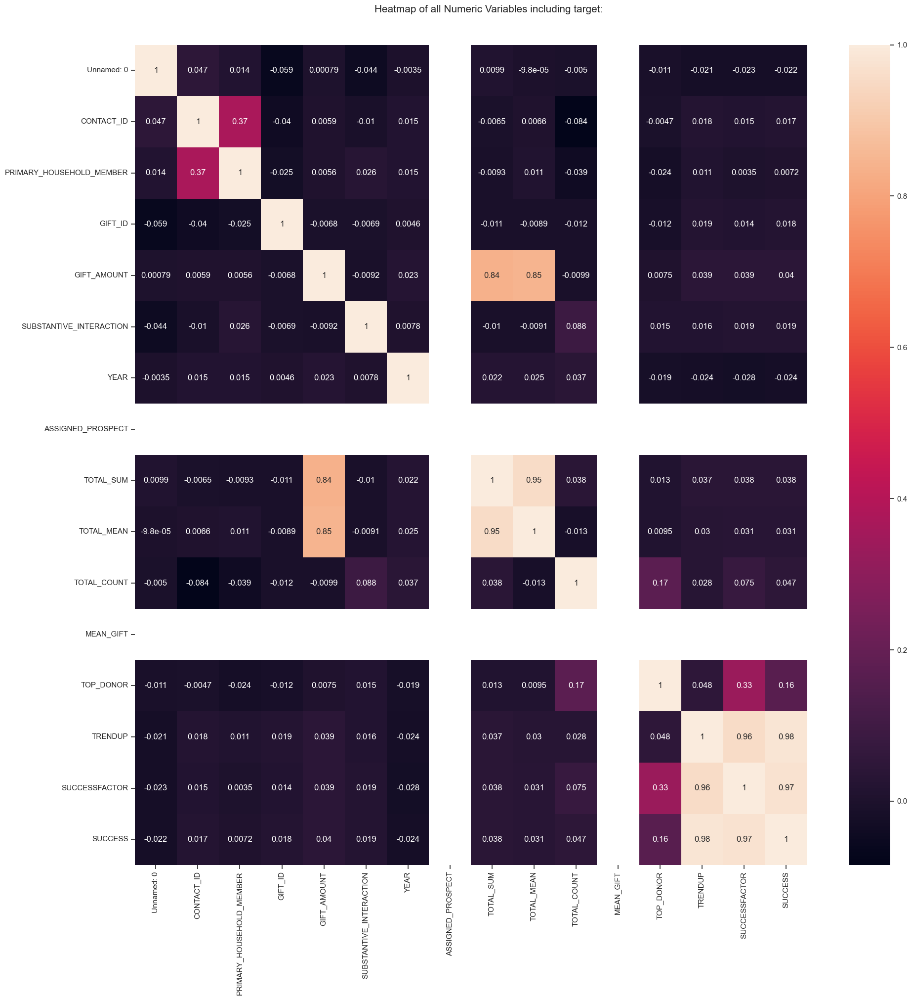

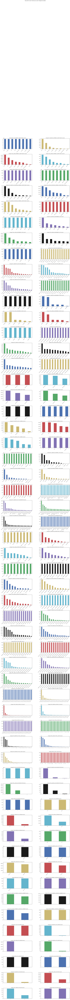

[nltk_data] Downloading collection 'popular'
[nltk_data]    | 
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     C:\Users\conta\AppData\Roaming\nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package gazetteers to
[nltk_data]    |     C:\Users\conta\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gazetteers is already up-to-date!
[nltk_data]    | Downloading package genesis to
[nltk_data]    |     C:\Users\conta\AppData\Roaming\nltk_data...
[nltk_data]    |   Package genesis is already up-to-date!
[nltk_data]    | Downloading package gutenberg to
[nltk_data]    |     C:\Users\conta\AppData\Roaming\nltk_data...
[nltk_data]    |   Package gutenberg is already up-to-date!
[nltk_data]    | Downloading package inaugural to
[nltk_data]    |     C:\Users\conta\AppData\Roaming\nltk_data...
[nltk_data]    |   Package inaugural is already up-to-date!
[nltk_data]    | Downloading package movie_reviews to
[nltk_data]   

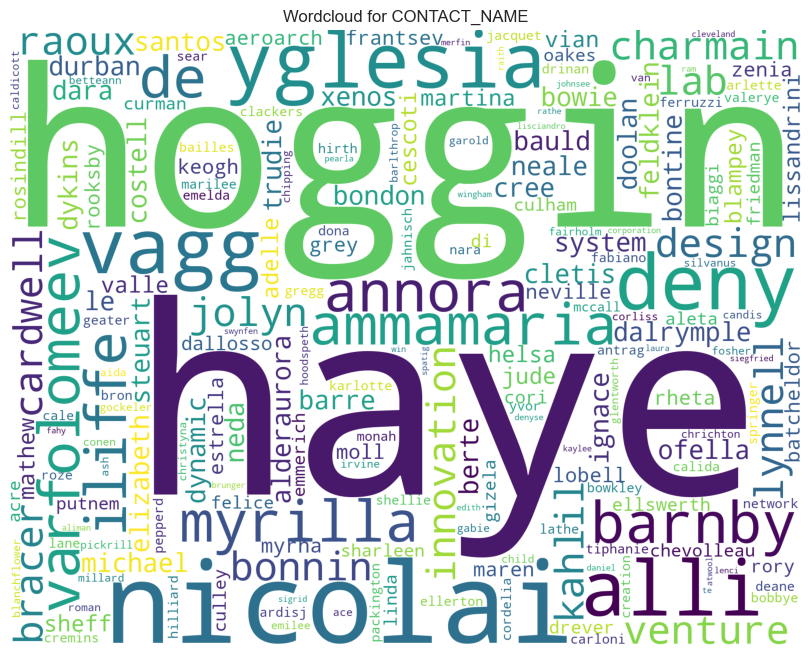

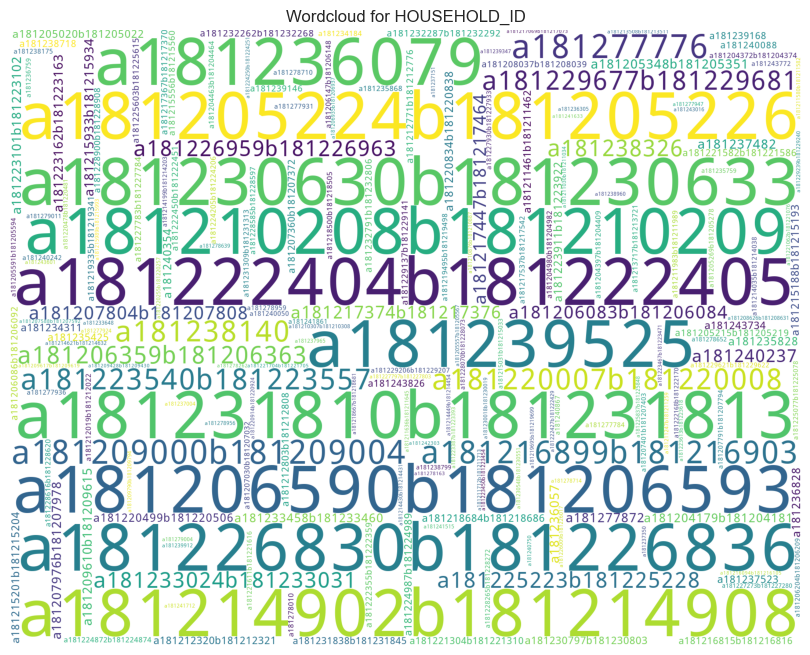

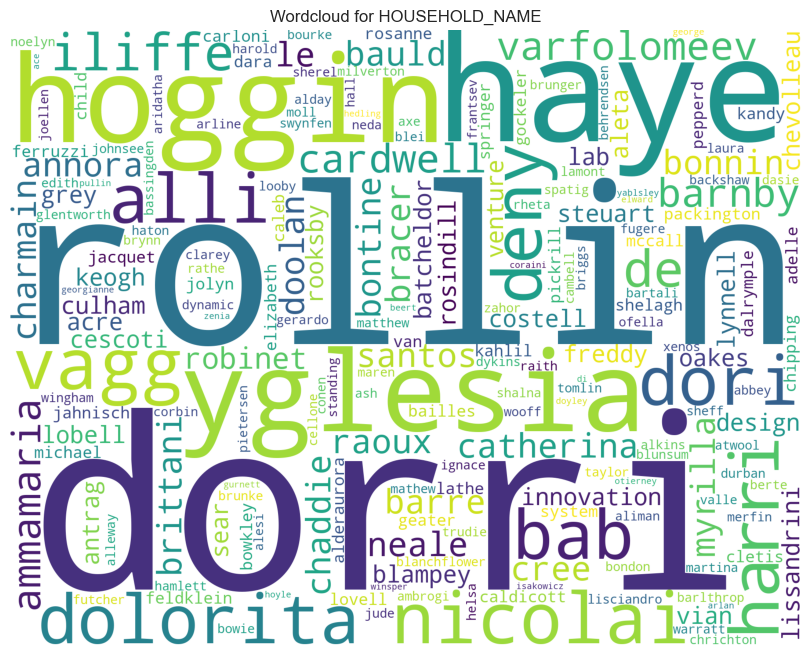

Could not draw wordcloud plot for GIFT_DATE. We need at least 1 word to plot a word cloud, got 0.
Could not draw wordcloud plot for ASSIGNMENT_START_DATE. We need at least 1 word to plot a word cloud, got 0.
Could not draw wordcloud plot for INTERACTION_DATE. We need at least 1 word to plot a word cloud, got 0.
Could not draw wordcloud plot for MONTHYEAR. We need at least 1 word to plot a word cloud, got 0.
All Plots done
Time to run AutoViz = 64 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


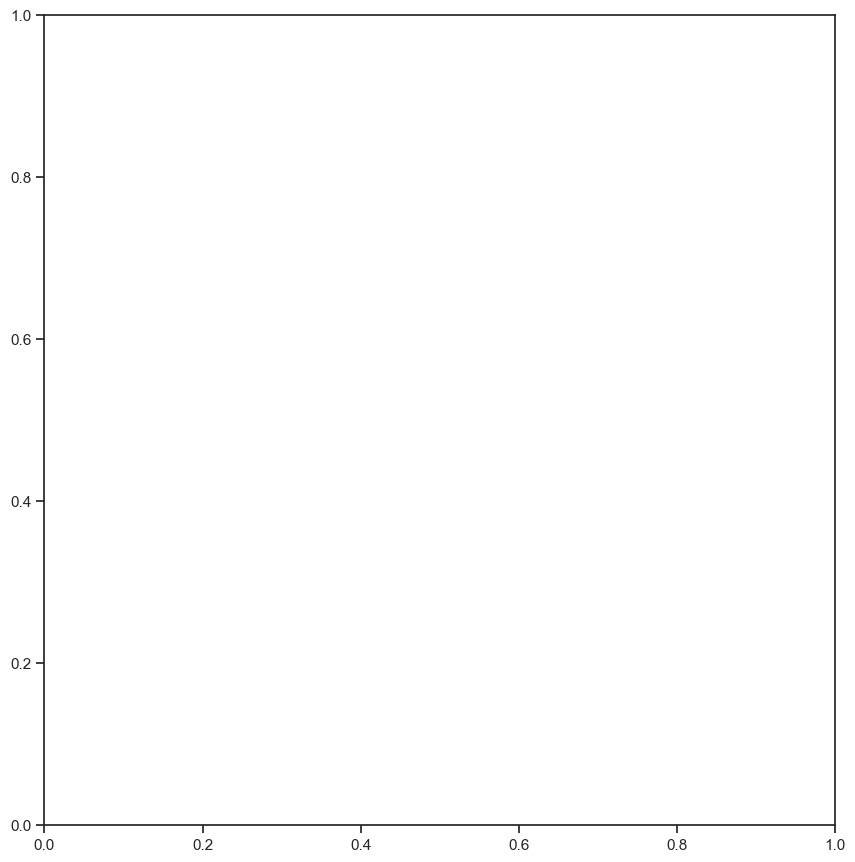

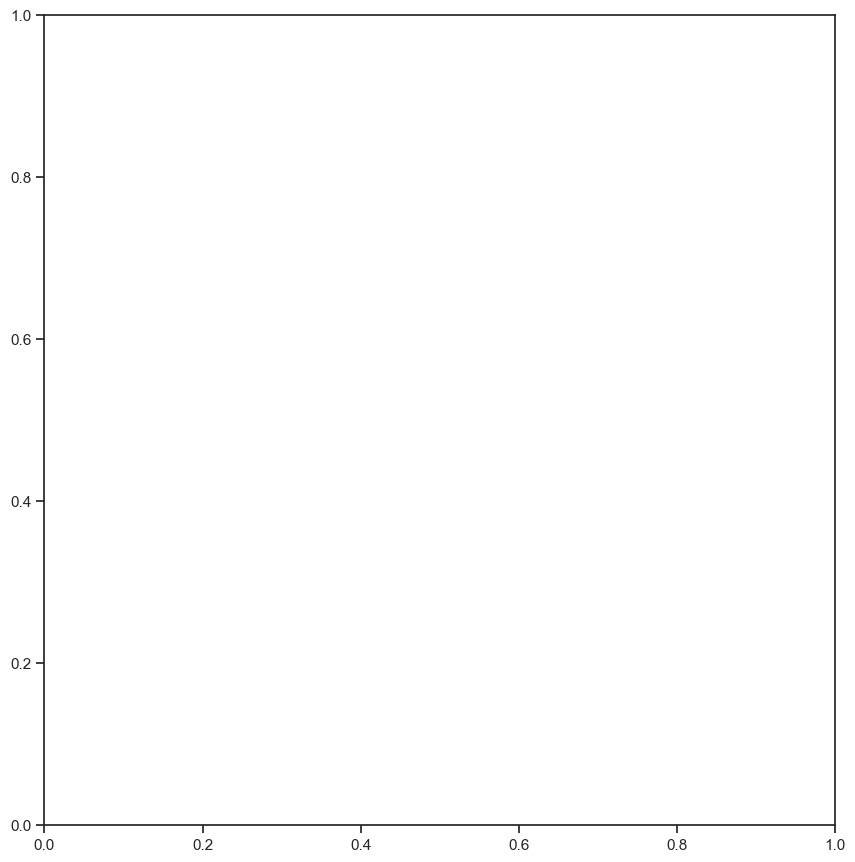

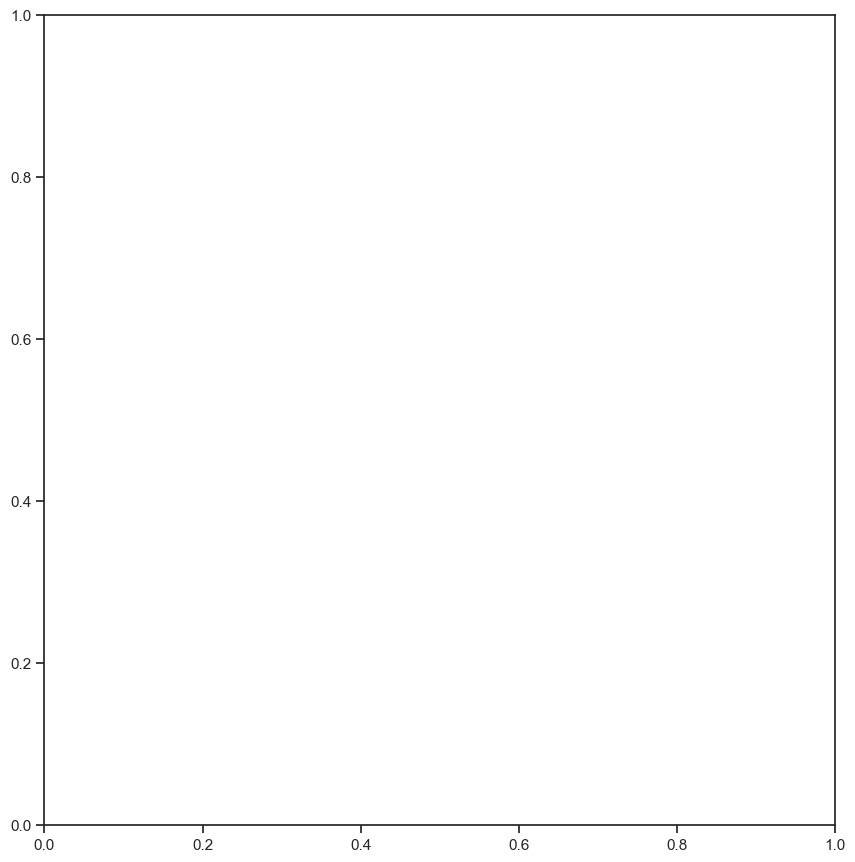

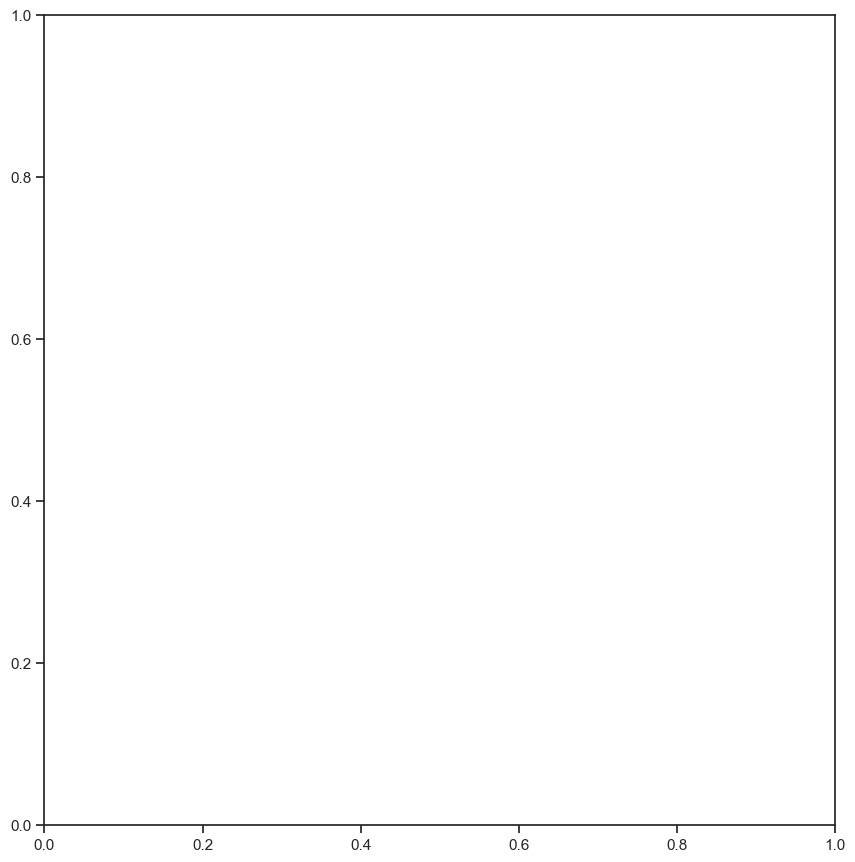

In [103]:
#Create visualizations
from autoviz.AutoViz_Class import AutoViz_Class

%matplotlib inline

AV = AutoViz_Class()

viz = AV.AutoViz("class-total.csv", sep=",")

## Clusters for Personaes
Create clusters using K Means to start to working towards personaes for marketing to use to drive donations

In [105]:
#Select fields for classifcation model
clusters = classdatatotal.filter(items=['GIFT_AMOUNT', 'TOTAL_SUM', 'TOTAL_MEAN', 'TOTAL_COUNT', 'ASSIGNMENT_UNIT', 'PAYMENT_TYPE'])
clusters.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 6 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   GIFT_AMOUNT      46199 non-null  float64
 1   TOTAL_SUM        46199 non-null  float64
 2   TOTAL_MEAN       46199 non-null  float64
 3   TOTAL_COUNT      46199 non-null  int64  
 4   ASSIGNMENT_UNIT  46199 non-null  object 
 5   PAYMENT_TYPE     46199 non-null  object 
dtypes: float64(3), int64(1), object(2)
memory usage: 2.5+ MB


In [106]:
#Encode object fields
clusters = pd.get_dummies(clusters, columns = ['ASSIGNMENT_UNIT', 'PAYMENT_TYPE'])
#Removed appeal as it did not factor into clusters
clusters.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 23 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   GIFT_AMOUNT                      46199 non-null  float64
 1   TOTAL_SUM                        46199 non-null  float64
 2   TOTAL_MEAN                       46199 non-null  float64
 3   TOTAL_COUNT                      46199 non-null  int64  
 4   ASSIGNMENT_UNIT_Athletics        46199 non-null  bool   
 5   ASSIGNMENT_UNIT_Business         46199 non-null  bool   
 6   ASSIGNMENT_UNIT_DXO              46199 non-null  bool   
 7   ASSIGNMENT_UNIT_Engineering      46199 non-null  bool   
 8   ASSIGNMENT_UNIT_Law              46199 non-null  bool   
 9   ASSIGNMENT_UNIT_Liberal Arts     46199 non-null  bool   
 10  ASSIGNMENT_UNIT_Regional         46199 non-null  bool   
 11  PAYMENT_TYPE_Bequest             46199 non-null  bool   
 12  PAYMENT_TYPE_Bequest 

In [107]:
#drop null values
clusters = clusters.dropna()

In [108]:
#create pipeline
pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=7, random_state=42))])

In [109]:
#fit classifcation model
pipeline.fit(clusters)

Pipeline(steps=[('scaler', StandardScaler()),
                ('kmeans', KMeans(n_clusters=7, random_state=42))])

In [110]:
#Create cluster labels
clusters['cluster'] = pipeline.named_steps['kmeans'].labels_

In [111]:
#Create cluster summary with preset 7 clusters
cluster_summary = clusters.groupby('cluster').mean()
print(cluster_summary)

          GIFT_AMOUNT    TOTAL_SUM    TOTAL_MEAN   TOTAL_COUNT  \
cluster                                                          
0        2.565917e+03  3.801457e+05  1.406493e+03  287.065994    
1        1.486829e+03  2.936752e+05  9.217218e+02  276.779070    
2        7.540038e+02  7.818159e+04  6.312982e+02  219.793194    
3        2.333333e+06  2.002000e+08  1.137500e+06  176.000000    
4        3.984000e+03  3.778141e+05  1.291183e+03  282.617412    
5        8.630643e+02  1.257229e+05  5.568330e+02  298.243412    
6        1.227366e+03  2.637352e+05  9.593777e+02  310.033833    

         ASSIGNMENT_UNIT_Athletics  ASSIGNMENT_UNIT_Business  \
cluster                                                        
0                0.000000                   0.000000           
1                0.063953                   0.106395           
2                0.000000                   0.000000           
3                0.000000                   0.000000           
4                0.06

In [112]:
clusters.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 24 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   GIFT_AMOUNT                      46199 non-null  float64
 1   TOTAL_SUM                        46199 non-null  float64
 2   TOTAL_MEAN                       46199 non-null  float64
 3   TOTAL_COUNT                      46199 non-null  int64  
 4   ASSIGNMENT_UNIT_Athletics        46199 non-null  bool   
 5   ASSIGNMENT_UNIT_Business         46199 non-null  bool   
 6   ASSIGNMENT_UNIT_DXO              46199 non-null  bool   
 7   ASSIGNMENT_UNIT_Engineering      46199 non-null  bool   
 8   ASSIGNMENT_UNIT_Law              46199 non-null  bool   
 9   ASSIGNMENT_UNIT_Liberal Arts     46199 non-null  bool   
 10  ASSIGNMENT_UNIT_Regional         46199 non-null  bool   
 11  PAYMENT_TYPE_Bequest             46199 non-null  bool   
 12  PAYMENT_TYPE_Bequest 

In [113]:
#Create an elbow curve to discover optimum numbers clusters, showed the elbow optimized all the way at 20 clusters

inertia = []

selected_columns =  ['TOTAL_SUM', 'TOTAL_COUNT', 'TOTAL_MEAN', 'ASSIGNMENT_UNIT_Athletics', 'ASSIGNMENT_UNIT_Business', 'ASSIGNMENT_UNIT_DXO', 'ASSIGNMENT_UNIT_Engineering',  
'ASSIGNMENT_UNIT_Law', 'ASSIGNMENT_UNIT_Liberal Arts', 'ASSIGNMENT_UNIT_Regional', 'PAYMENT_TYPE_Bequest', 'PAYMENT_TYPE_Bequest Payment', 'PAYMENT_TYPE_Cash',  'PAYMENT_TYPE_Gift', 'PAYMENT_TYPE_Gift Annuity', 'PAYMENT_TYPE_Gift In Kind', 'PAYMENT_TYPE_Life Insurance', 
'PAYMENT_TYPE_Matching Gift', 'PAYMENT_TYPE_Pledge', 'PAYMENT_TYPE_Pledge Payment', 'PAYMENT_TYPE_Pooled Income Fund', 'PAYMENT_TYPE_Real Estate']

clusters = clusters.filter(items=[ 'TOTAL_SUM', 'TOTAL_COUNT', 'TOTAL_MEAN', 'ASSIGNMENT_UNIT_Athletics', 'ASSIGNMENT_UNIT_Business', 'ASSIGNMENT_UNIT_DXO', 'ASSIGNMENT_UNIT_Engineering',  
'ASSIGNMENT_UNIT_Law', 'ASSIGNMENT_UNIT_Liberal Arts', 'ASSIGNMENT_UNIT_Regional', 'PAYMENT_TYPE_Bequest', 'PAYMENT_TYPE_Bequest Payment', 'PAYMENT_TYPE_Cash', 
'PAYMENT_TYPE_Charitable Remainder Trust', 'PAYMENT_TYPE_Gift', 'PAYMENT_TYPE_Gift Annuity', 'PAYMENT_TYPE_Gift In Kind', 'PAYMENT_TYPE_Life Insurance', 
'PAYMENT_TYPE_Matching Gift', 'PAYMENT_TYPE_Pledge', 'PAYMENT_TYPE_Pledge Payment', 'PAYMENT_TYPE_Pooled Income Fund', 'PAYMENT_TYPE_Real Estate'])


In [114]:
clusters.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   TOTAL_SUM                        46199 non-null  float64
 1   TOTAL_COUNT                      46199 non-null  int64  
 2   TOTAL_MEAN                       46199 non-null  float64
 3   ASSIGNMENT_UNIT_Athletics        46199 non-null  bool   
 4   ASSIGNMENT_UNIT_Business         46199 non-null  bool   
 5   ASSIGNMENT_UNIT_DXO              46199 non-null  bool   
 6   ASSIGNMENT_UNIT_Engineering      46199 non-null  bool   
 7   ASSIGNMENT_UNIT_Law              46199 non-null  bool   
 8   ASSIGNMENT_UNIT_Liberal Arts     46199 non-null  bool   
 9   ASSIGNMENT_UNIT_Regional         46199 non-null  bool   
 10  PAYMENT_TYPE_Bequest             46199 non-null  bool   
 11  PAYMENT_TYPE_Bequest Payment     46199 non-null  bool   
 12  PAYMENT_TYPE_Cash    

Inertia  [1016378.000000004, 928067.9857797503, 865379.6531077588, 816814.4469986213, 756985.9602030114, 710077.0378900899, 659429.7938875507, 607606.3020458361, 561148.8970618758, 517641.7338223164, 474380.1839735795, 428336.62168007606, 382697.1948395436, 335933.8917640318, 289721.099178539, 243543.95850292794, 197453.91067141187, 151841.26946582342, 106920.066942725, 93538.3277522517, 84216.85047736403, 75163.9432136406, 70373.21965014454, 64514.51599765898, 60634.942564920166, 55204.4340326859, 51148.32678142473, 49008.934024552254, 44349.78529952132, 42459.27550990371, 41482.745154249365, 39341.82350022509, 37009.418071142354, 35501.4384085333, 32786.01334664683, 32860.39038948644, 30904.213164565903, 29753.301540123844, 28070.684060713997, 26632.208991344087, 25751.840623116957, 25153.102732906125, 23518.260036187603, 22481.965698937172, 21977.753739389726, 20057.14716133831, 19583.17593856814, 19164.640140274132, 18071.192287071375, 17059.552951244612]


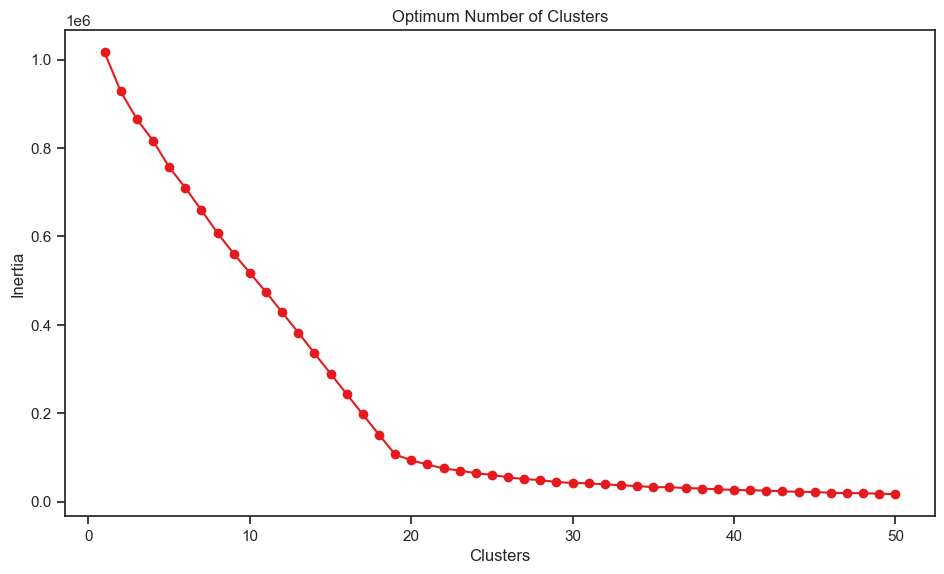

In [115]:
#Scale data and Create clusters with inertia metrics to measure how well the data set has been measured.


scaler = StandardScaler() 

datascaled = scaler.fit_transform(clusters)

preprocessed = pd.DataFrame(datascaled, columns=selected_columns)


for k in range(1,51):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(preprocessed)
    inertia.append(kmeans.inertia_)

print("Inertia ", inertia)


plt.figure(figsize=(10,6))
plt.plot(range(1,51), inertia, marker='o')
plt.xlabel('Clusters')
plt.ylabel('Inertia')
plt.title('Optimum Number of Clusters')
plt.show()

According to the chart above the optimum number of clusters is 19. While this may be optimum, this may be a lot for a marketing organization to use.  Important features are around the total monetary amounts. Next steps would look at reaggregating some of the gift payment types.  Additionally I would look for an additonal data set that included demographic and psycographic information to humanize the personaes. 

## Top Donor Prediction - Regression
Create a regression model to identify top donors and the realtionship between variables and top donor target. I decided to stick with a simple regression model as it works for this use case, and with fundraising not having a developed analytics program, so I would keep it simple. 

In [118]:
#Create a top donor field
apradatatotal['Top Donor'] = (apradatatotal['GIFT_AMOUNT']>1754).astype(int)

In [119]:
#Clear out null values
apradatatotal = apradatatotal.dropna()

In [120]:
apradatatotal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58738 entries, 39 to 240802
Data columns (total 41 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   CONTACT_ID                      58738 non-null  int64         
 1   IS_PERSON                       58738 non-null  bool          
 2   DECEASED                        58738 non-null  bool          
 3   CONTACT_NAME                    58738 non-null  object        
 4   HOUSEHOLD_ID                    58738 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        58738 non-null  int32         
 6   HOUSEHOLD_NAME                  58738 non-null  object        
 7   PRIMARY_CONSTITUENCY            58738 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  58738 non-null  object        
 9   ASSIGNED_PROSEPCT               58738 non-null  bool          
 10  ASSIGNMENT_UNIT                 58738 non-null  object        
 11  SOLIC

In [121]:
#Create model data sets

columns_to_drop = ['CONTACT_ID', 'TOTAL_SUM', 'TOTAL_MEAN', 'IS_PERSON', 'DECEASED', 'CONTACT_NAME', 'HOUSEHOLD_ID', 'PRIMARY_HOUSEHOLD_MEMBER', 'HOUSEHOLD_NAME', 'PRIMARY_CONSTITUENCY',      
'HOUSEHOLD_PRIMARY_CONSTITUENCY', 'ASSIGNED_PROSEPCT', 'ASSIGNMENT_START_DATE',  'ASSIGNMENT_STAGE', 'GIFT_DESIGNATION', 'INTERACTION_DATE', 'INTERACTION_TYPE',              
'SUBSTANTIVE_INTERACTION', 'INTERACTION_SUMMARY', 'AUTHOR_NAME', 'MONTHYEAR', 'YEAR', 'ASSIGNED_PROSPECT', 'GIFT_DATE',  'GIFT_AMOUNT', 'GIFT_ID', 'Top Donor']

X = apradatatotal.drop(columns=columns_to_drop, axis=1)
y = apradatatotal['Top Donor']

In [122]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Index: 58738 entries, 39 to 240802
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ASSIGNMENT_UNIT    58738 non-null  object 
 1   SOLICITOR_NAME     58738 non-null  object 
 2   APPEAL             58738 non-null  object 
 3   PRIMARY_UNIT       58738 non-null  object 
 4   GIFT_CHANNEL       58738 non-null  object 
 5   PAYMENT_TYPE       58738 non-null  object 
 6   GIFT_TYPE          58738 non-null  object 
 7   TOTAL_COUNT        58738 non-null  int64  
 8   MEAN_GIFT          58738 non-null  float64
 9   TOP_DONOR          58738 non-null  int32  
 10  TRENDUP            58738 non-null  float64
 11  SUCCESSFACTOR      58738 non-null  int32  
 12  SUCCESS            58738 non-null  int32  
 13  SOLICITOR_SUCCESS  58738 non-null  object 
dtypes: float64(2), int32(3), int64(1), object(8)
memory usage: 6.0+ MB


In [128]:
#load categorical columns for later encoding
categoricals = X.select_dtypes(include=['object']).columns
print(categoricals)

Index(['ASSIGNMENT_UNIT', 'SOLICITOR_NAME', 'APPEAL', 'PRIMARY_UNIT',
       'GIFT_CHANNEL', 'PAYMENT_TYPE', 'GIFT_TYPE', 'SOLICITOR_SUCCESS'],
      dtype='object')


In [135]:
#Encode categoricals
X_encoded = pd.get_dummies(X, columns = categoricals, drop_first=True)

In [136]:
#Create trainging and test
X_train, X_test, y_train, y_test = train_test_split(X_encoded, y, test_size=0.3, random_state=42)

In [137]:
#Run lasso to see top, non zero features
lasso = Lasso(alpha = 0.01)
lasso.fit(X_train, y_train)

Lasso(alpha=0.01)

In [138]:
lasso_importance = pd.DataFrame({
    'Feature': X_encoded.columns,
    'Coefficient': lasso.coef_
})

In [139]:
#Print out important features
important_features = lasso_importance[lasso_importance['Coefficient']!=0]
print(important_features)

            Feature            Coefficient
0                 TOTAL_COUNT   0.000033  
44          PAYMENT_TYPE_Gift  -0.011719  
45  PAYMENT_TYPE_Gift Annuity   0.301407  


In [140]:
#Scale
scaler = StandardScaler()

In [141]:
#Scale and fit

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.fit_transform(X_test)

In [142]:
logreg = LogisticRegression()

In [143]:
#Create a parameter grid
param_grid = {
    'C': [0.01, 0.1, 1, 10, 100], 'solver': ['liblinear', 'lbfgs']
}

In [144]:
#Run grid search model and cross validation

grid_search = GridSearchCV(logreg, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train_scaled, y_train)

GridSearchCV(cv=5, estimator=LogisticRegression(),
             param_grid={'C': [0.01, 0.1, 1, 10, 100],
                         'solver': ['liblinear', 'lbfgs']},
             scoring='accuracy')

In [145]:
#Print out best parameters
print("Best Parameters:", grid_search.best_params_)

Best Parameters: {'C': 0.1, 'solver': 'liblinear'}


In [146]:
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_scaled)

In [147]:
print(best_model)

LogisticRegression(C=0.1, solver='liblinear')


In [148]:
#Reviews KPIs
print("Classification Report:\n", classification_report(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.96      1.00      0.98     16520
           1       1.00      0.33      0.50      1102

    accuracy                           0.96     17622
   macro avg       0.98      0.67      0.74     17622
weighted avg       0.96      0.96      0.95     17622



In [149]:
#Check Scores
cross_val_scores = cross_val_score(best_model, X_train_scaled, y_train, cv=5)
print("Cross=validation Scores:", cross_val_scores)
print("Mean CV Accuracy:", cross_val_scores.mean())

Cross=validation Scores: [0.95488813 0.95962544 0.95780129 0.95828773 0.9567068 ]
Mean CV Accuracy: 0.9574618779488681


The Lasso regression did not produced significant features. The best parameters for the logistic regression was LogisticRegression(C=0.1, solver='liblinear'). With a 50% F1 score, I do not think that I would deploy this model to the business. 

## Solicitor Classification

In [197]:
classdatatotal.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 40 columns):
 #   Column                          Non-Null Count  Dtype         
---  ------                          --------------  -----         
 0   CONTACT_ID                      46199 non-null  int64         
 1   IS_PERSON                       46199 non-null  bool          
 2   DECEASED                        46199 non-null  bool          
 3   CONTACT_NAME                    46199 non-null  object        
 4   HOUSEHOLD_ID                    46199 non-null  object        
 5   PRIMARY_HOUSEHOLD_MEMBER        46199 non-null  int32         
 6   HOUSEHOLD_NAME                  46199 non-null  object        
 7   PRIMARY_CONSTITUENCY            46199 non-null  object        
 8   HOUSEHOLD_PRIMARY_CONSTITUENCY  46199 non-null  object        
 9   ASSIGNED_PROSEPCT               46199 non-null  bool          
 10  ASSIGNMENT_UNIT                 46199 non-null  object        
 11  SOLIC

In [199]:
#Clean missing values
classdatatotal['SOLICITOR_SUCCESS'] = classdatatotal['SOLICITOR_SUCCESS'].fillna('None')

In [201]:
classdatatotal['SOLICITOR_SUCCESS'].value_counts()

SOLICITOR_SUCCESS
None                         22399
Bandt, Cindy_Success          6580
Embury, Sabina_Success        5957
Arp, Josefina_Success         1651
Anespie, Kipp_Success         1237
Klausen, Leonerd_Success      1228
Reiach, Etienne_Success        972
Misken, Brnaby_Success         876
Priddis, Alfreda_Success       847
Gownge, Lurleen_Success        783
Simeon, Carmelina_Success      782
Donaghy, Brnaba_Success        646
Hanretty, Rodd_Success         644
Coll, Libbie_Success           631
Egginson, Reggie_Success       581
Ryburn, Rab_Success            385
Name: count, dtype: int64

In [203]:
le = LabelEncoder()

In [205]:
classdatatotal['SOLICITOR_SUCCESS'] = le.fit_transform(classdatatotal['SOLICITOR_SUCCESS'])

In [207]:
solicitor_label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))

In [209]:
print(solicitor_label_mapping)

{'Anespie, Kipp_Success': 0, 'Arp, Josefina_Success': 1, 'Bandt, Cindy_Success': 2, 'Coll, Libbie_Success': 3, 'Donaghy, Brnaba_Success': 4, 'Egginson, Reggie_Success': 5, 'Embury, Sabina_Success': 6, 'Gownge, Lurleen_Success': 7, 'Hanretty, Rodd_Success': 8, 'Klausen, Leonerd_Success': 9, 'Misken, Brnaby_Success': 10, 'None': 11, 'Priddis, Alfreda_Success': 12, 'Reiach, Etienne_Success': 13, 'Ryburn, Rab_Success': 14, 'Simeon, Carmelina_Success': 15}


In [211]:
classification =  classdatatotal.filter(items=['GIFT_AMOUNT', 'TOTAL_SUM', 'TOTAL_MEAN', 'TOTAL_COUNT', 'ASSIGNMENT_UNIT', 'PAYMENT_TYPE', 'YEAR', 'SOLICITOR_SUCCESS', 'GIFT_CHANNEL', 'GIFT_TYPE'])

In [213]:
classification = pd.get_dummies(classification, columns = ['ASSIGNMENT_UNIT', 'PAYMENT_TYPE', 'GIFT_CHANNEL', 'GIFT_TYPE'])

In [215]:
classification.info()

<class 'pandas.core.frame.DataFrame'>
Index: 46199 entries, 39 to 240623
Data columns (total 32 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   GIFT_AMOUNT                      46199 non-null  float64
 1   TOTAL_SUM                        46199 non-null  float64
 2   TOTAL_MEAN                       46199 non-null  float64
 3   TOTAL_COUNT                      46199 non-null  int64  
 4   YEAR                             46199 non-null  float64
 5   SOLICITOR_SUCCESS                46199 non-null  int32  
 6   ASSIGNMENT_UNIT_Athletics        46199 non-null  bool   
 7   ASSIGNMENT_UNIT_Business         46199 non-null  bool   
 8   ASSIGNMENT_UNIT_DXO              46199 non-null  bool   
 9   ASSIGNMENT_UNIT_Engineering      46199 non-null  bool   
 10  ASSIGNMENT_UNIT_Law              46199 non-null  bool   
 11  ASSIGNMENT_UNIT_Liberal Arts     46199 non-null  bool   
 12  ASSIGNMENT_UNIT_Regio

In [217]:
X = classification.drop(['SOLICITOR_SUCCESS'], axis=1)
y = classification['SOLICITOR_SUCCESS']

In [219]:
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3, random_state=42)

In [221]:
#Set up multiple classification models to try

models = {
    'Logistic Regression': LogisticRegression(multi_class='multinomial', solver='lbfgs', max_iter=500),
    'Random Forest': RandomForestClassifier(),
    'SVM': SVC(probability=True),
    'KNN': KNeighborsClassifier()
}

In [223]:
for model_name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(f"\n-- {model_name} ---")
    print(classification_report(y_test, y_pred))
    print(confusion_matrix(y_test, y_pred))


-- Logistic Regression ---
              precision    recall  f1-score   support

           0       0.00      0.00      0.00       360
           1       0.00      0.00      0.00       499
           2       0.39      0.03      0.05      2004
           3       0.00      0.00      0.00       181
           4       0.00      0.00      0.00       196
           5       0.00      0.00      0.00       157
           6       0.21      0.00      0.01      1782
           7       0.00      0.00      0.00       244
           8       0.00      0.00      0.00       202
           9       0.00      0.00      0.00       356
          10       0.00      0.00      0.00       258
          11       0.49      1.00      0.66      6706
          12       0.00      0.00      0.00       254
          13       0.00      0.00      0.00       301
          14       0.00      0.00      0.00       113
          15       0.00      0.00      0.00       247

    accuracy                           0.49     1386

In [225]:
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [10, 20, 30],
    'min_samples_split': [2,5,10],
    'min_samples_leaf':[1,2,4]
}

In [227]:
#set up a grid search for optimization

grid_search = GridSearchCV(estimator=RandomForestClassifier(), param_grid=param_grid, cv=3, verbose=2, n_jobs=1)

In [229]:
#fit all of the different models with the different parameters
grid_search.fit(X_train, y_train)

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=100; total time=   0.8s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.6s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=200; total time=   1.7s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   2.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   2.5s
[CV] END max_depth=10, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   2.5s
[CV] END max_depth=10, min_sa

GridSearchCV(cv=3, estimator=RandomForestClassifier(), n_jobs=1,
             param_grid={'max_depth': [10, 20, 30],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 300]},
             verbose=2)

In [231]:
#Output best parameters from the grid search

print(f"Best Parameters: {grid_search.best_params_}")

Best Parameters: {'max_depth': 30, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}


In [233]:
#Set best model and cv scores
best_model = grid_search.best_estimator_
cv_scores = cross_val_score(best_model, X, y, cv=5)

In [234]:
#Output best model
print(best_model)

RandomForestClassifier(max_depth=30, n_estimators=200)


In [235]:
#Output cv scores and take mean of outputted CV scores

print(f"CV Scores: {cv_scores}")
print(f"Mean CV Score: {cv_scores.mean()}")

CV Scores: [0.44209957 0.4482684  0.43181818 0.42748918 0.43890031]
Mean CV Score: 0.4377151277124218


In [239]:
#Set features that are important

importances = best_model.feature_importances_
sorted_indices = np.argsort(importances)[::-1]

[Text(0.681468068159596, 0.9838709677419355, 'ASSIGNMENT_UNIT_DXO <= 0.5\ngini = 0.722\nsamples = 20446\nvalue = [934, 1092, 4505, 464, 444, 408, 4163, 558, 437, 848\n631, 15740, 622, 666, 293, 534]'),
 Text(0.41313425719793795, 0.9516129032258065, 'TOTAL_COUNT <= 885.0\ngini = 0.753\nsamples = 9457\nvalue = [934, 1092, 0, 464, 444, 408, 0, 558, 437, 848, 631\n7095, 622, 666, 293, 534]'),
 Text(0.3562970894765913, 0.9193548387096774, 'ASSIGNMENT_UNIT_Engineering <= 0.5\ngini = 0.749\nsamples = 9123\nvalue = [934, 741, 0, 464, 444, 408, 0, 558, 437, 848, 631\n6930, 622, 666, 293, 534]'),
 Text(0.2767074546140586, 0.8870967741935484, 'ASSIGNMENT_UNIT_Business <= 0.5\ngini = 0.744\nsamples = 8135\nvalue = [934, 741, 0, 464, 444, 408, 0, 0, 437, 848, 631\n6191, 622, 666, 0, 534]'),
 Text(0.20904412184908708, 0.8548387096774194, 'ASSIGNMENT_UNIT_Regional <= 0.5\ngini = 0.74\nsamples = 5682\nvalue = [934, 0, 0, 464, 444, 408, 0, 0, 437, 848, 0\n4286, 622, 666, 0, 0]'),
 Text(0.16968617745542

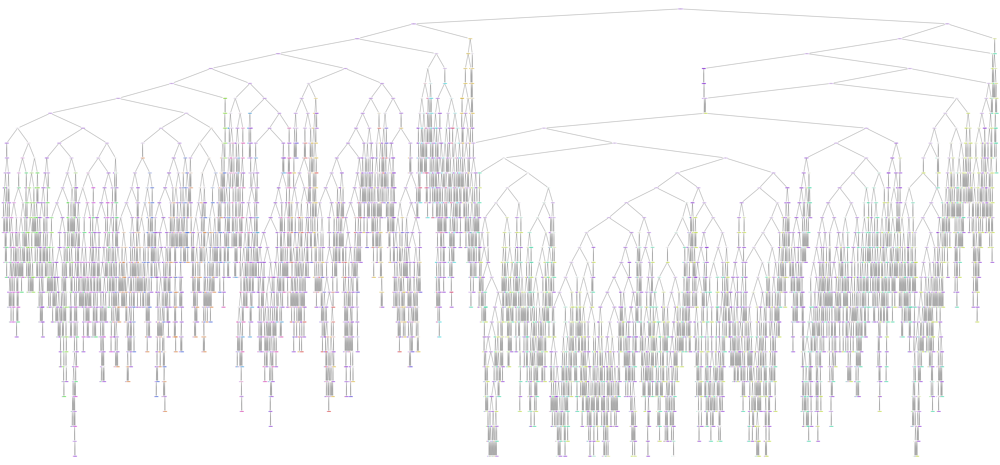

In [241]:
from sklearn.tree import plot_tree

plt.figure(figsize=(80,40))
plot_tree(best_model.estimators_[5], feature_names=X_train.columns, filled=True)

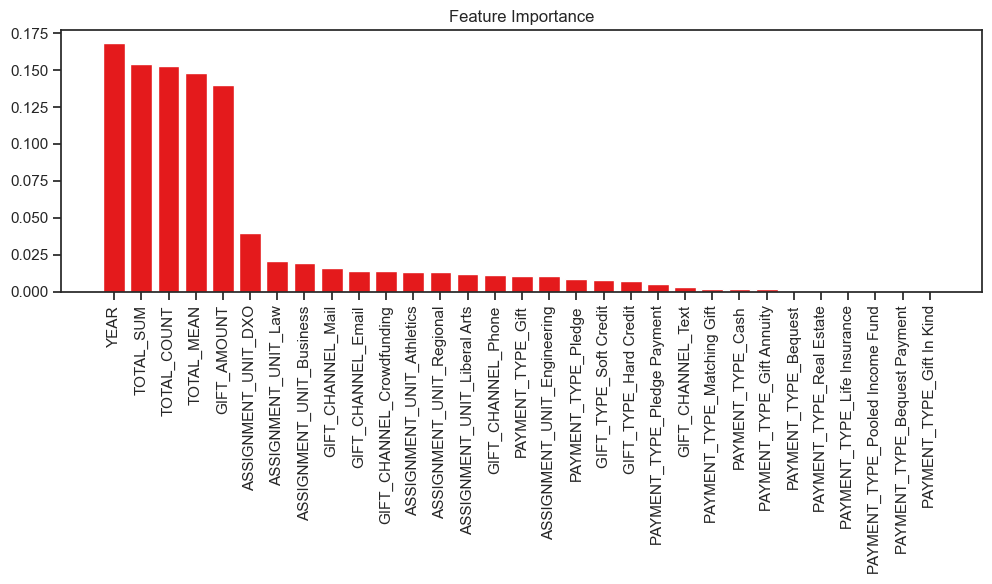

In [243]:
#Plot the most important features sorted by indices

plt.figure(figsize=(10,6))
plt.title("Feature Importance")
plt.bar(range(X.shape[1]), importances[sorted_indices], align="center")
plt.xticks(range(X.shape[1]), X.columns[sorted_indices], rotation=90)
plt.tight_layout()
plt.show()

In [245]:
#Find precision, recall, f1 and support by classifier

y_pred_final = best_model.predict(X_test)
print(classification_report(y_test, y_pred_final))

              precision    recall  f1-score   support

           0       0.97      0.95      0.96       360
           1       0.98      0.95      0.96       499
           2       0.96      0.93      0.94      2004
           3       0.97      0.94      0.96       181
           4       0.99      0.94      0.97       196
           5       0.97      0.94      0.95       157
           6       0.96      0.92      0.94      1782
           7       0.99      0.95      0.97       244
           8       0.95      0.93      0.94       202
           9       0.97      0.95      0.96       356
          10       0.97      0.94      0.95       258
          11       0.94      0.98      0.96      6706
          12       0.96      0.98      0.97       254
          13       0.97      0.93      0.95       301
          14       0.98      0.95      0.96       113
          15       0.97      0.90      0.93       247

    accuracy                           0.95     13860
   macro avg       0.97   

<function matplotlib.pyplot.show(close=None, block=None)>

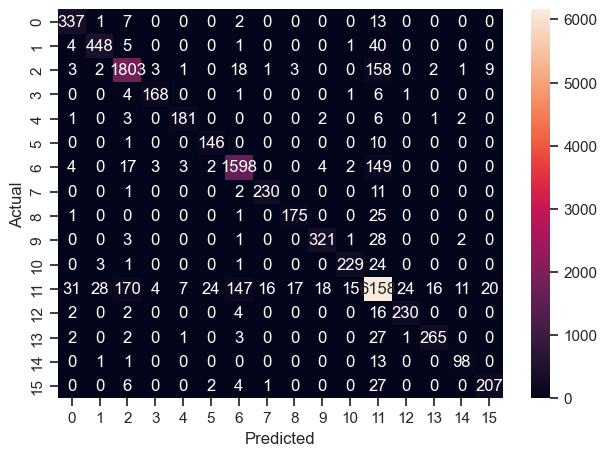

In [247]:
#Create confusion matrix

cm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm, annot=True, fmt='d')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show

In [249]:
#Calculate accuracy by class

class_accuarcies = cm.diagonal()/cm.sum(axis=1)

In [251]:
#Get overall accuracy per classifer aka solicitor

for i, acc in enumerate(class_accuarcies):
    print(f"Class {i}: {acc * 100:.2f}% accuracy")

#Class 11 is None, Class 7 is Lurleen Gownge, Class 0 is Kipp Anespie, Class5 is Brnba Donaghy, Class 3 is Reggie Egginson Class 4 is Rodd Hanretty, 

Class 0: 93.61% accuracy
Class 1: 89.78% accuracy
Class 2: 89.97% accuracy
Class 3: 92.82% accuracy
Class 4: 92.35% accuracy
Class 5: 92.99% accuracy
Class 6: 89.67% accuracy
Class 7: 94.26% accuracy
Class 8: 86.63% accuracy
Class 9: 90.17% accuracy
Class 10: 88.76% accuracy
Class 11: 91.83% accuracy
Class 12: 90.55% accuracy
Class 13: 88.04% accuracy
Class 14: 86.73% accuracy
Class 15: 83.81% accuracy


Uses cases, when new donors come into the database, we can predict if there is a solicitor that would be preferred for that donor in order to optimize the giving (amount and growth year of year) using a prediction like solicitor_predictions = best_model.predict(new_donor_data). Random Forest produced the best classifier model at a max depth of 30, minimum sample splits of 2 and 200 estimators.

The strongest predictions came with Lurleen Gownge, Kipp Anespie, Brnba Donaghy, Reggie Egginson and Rodd Hanretty, 